# Test 2-Stage OpenPose with MobileNet Backbone

In [1]:
import os
import sys
import json
import collections
from tqdm import tqdm

import numpy as np
import cv2
import matplotlib.pyplot as plt
import torch
from torch.nn import DataParallel
import torchvision
import torchvision.transforms as transforms
import torch.nn.functional as F
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

sys.path.append("..")

from data import StyledCoco
import models
from CONFIG import CONFIG
import CONSTANTS
import data
import lib.arguments as arguments
import lib.utils as utils
import lib.metrics as metrics
import lib.pose_parsing as pose_parsing 
import lib.visualizations as visualizations

In [2]:
%reload_ext autoreload
%autoreload 2

In [3]:
test_exp = "test/experiment_2020-06-04_08-06-38"
test_exp = os.path.join(CONFIG["paths"]["experiments_path"], test_exp)

## Dataset

In [4]:
image_size = 600
exp_data = utils.load_experiment_parameters(test_exp)
exp_data["training"]["batch_size"] = 4
exp_data["dataset"]["dataset_name"] = "coco"
exp_data["dataset"]["image_size"] = image_size
exp_data["model"]["model_name"] = "OpenPose"

In [5]:
_, valid_loader = data.load_dataset(exp_data=exp_data, train=False,
                                    validation=True, shuffle_train=True,
                                    shuffle_valid=False)

_, random_loader = data.load_dataset(exp_data=exp_data, train=False,
                                    validation=True, shuffle_train=True,
                                    shuffle_valid=True)

loading annotations into memory...
Done (t=0.27s)
creating index...
index created!
loading annotations into memory...
Done (t=0.34s)
creating index...
index created!


## Model

In [68]:
model = models.OpenPoseVGG()
pretrained_path = os.path.join(CONFIG["paths"]["pretrained_path"], "OpenPoseVGG", "body_pose_model.pth")
model.load_pretrained(pretrained_path)

In [69]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = model.to(device)

## Inference

In [70]:
# iterator = iter(valid_loader)
# for i in range(1):
#     imgs, heatmaps, pafs, mask, metadata = iterator.next()
imgs, heatmaps, pafs, mask, metadata = iter(random_loader).next()

In [71]:
print(imgs.shape)
print(heatmaps.shape)
print(pafs.shape)

torch.Size([1, 3, 600, 600])
torch.Size([1, 19, 600, 600])
torch.Size([1, 38, 600, 600])


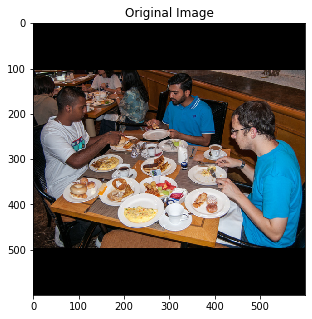

In [72]:
plt.figure(figsize=(6, 5))

ax = plt.gca()
visualizations.visualize_image(np.array(imgs[0,:]), ax=ax, title="Original Image")

In [73]:
def multiscale_inference(model, imgs, scales, image_size, device):
    
    batch_size = imgs.shape[0]
    avg_heatmaps = np.zeros((batch_size, 19, image_size, image_size), dtype=np.float32)
    avg_pafs = np.zeros((batch_size, 38, image_size, image_size), dtype=np.float32)
    avg_heatmaps = torch.Tensor(avg_heatmaps).to(device)
    avg_pafs = torch.Tensor(avg_pafs).to(device)
    
    for ratio in scales:
        
        scaled_img = F.interpolate(imgs, int(round(ratio*image_size)), mode="bilinear", align_corners=True)
        
        pred_pafs_, pred_heatmaps_ = model(scaled_img.to(device).float())
        
        scaled_pafs = F.interpolate(pred_pafs_.clone().detach(), image_size, mode="bilinear", align_corners=True).to(device)
        scaled_hms = F.interpolate(pred_heatmaps_.clone().detach(), image_size, mode="bilinear", align_corners=True).to(device)
        
        avg_heatmaps += scaled_hms
        avg_pafs += scaled_pafs
    
    avg_heatmaps = avg_heatmaps/len(scales)
    avg_pafs = avg_pafs/len(scales)
    
    return avg_heatmaps, avg_pafs

    

In [74]:
scales = [0.5, 1.0, 1.5, 2.0]
scaled_hms, scaled_pafs = multiscale_inference(model, imgs, scales, image_size, device)

In [75]:
print(scaled_hms.shape)
print(scaled_pafs.shape)

torch.Size([1, 19, 600, 600])
torch.Size([1, 38, 600, 600])


In [76]:
scaled_hms = np.array(scaled_hms[0,:].cpu())
scaled_pafs = np.array(scaled_pafs[0,:].cpu())

In [77]:
IDX_TO_KPT_NAME = {0: 'Nose', 1: 'Neck', 2: 'Right Shoulder', 3: 'Right Elbow', 4: 'Right Wrist', 5: 'Left Shoulder',
                   6: 'Left Elbow', 7: 'Left Wrist', 8: 'Right Hip', 9: 'Right Knee', 10: 'Right Ankle',
                   11: 'Left Hip', 12: 'Left Knee', 13: 'Left Ankle', 14: 'Right Eye', 15: 'Left Eye', 16: 'Right Ear',
                   17: 'Left Ear', 18:"-"}

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

KeyError: 18

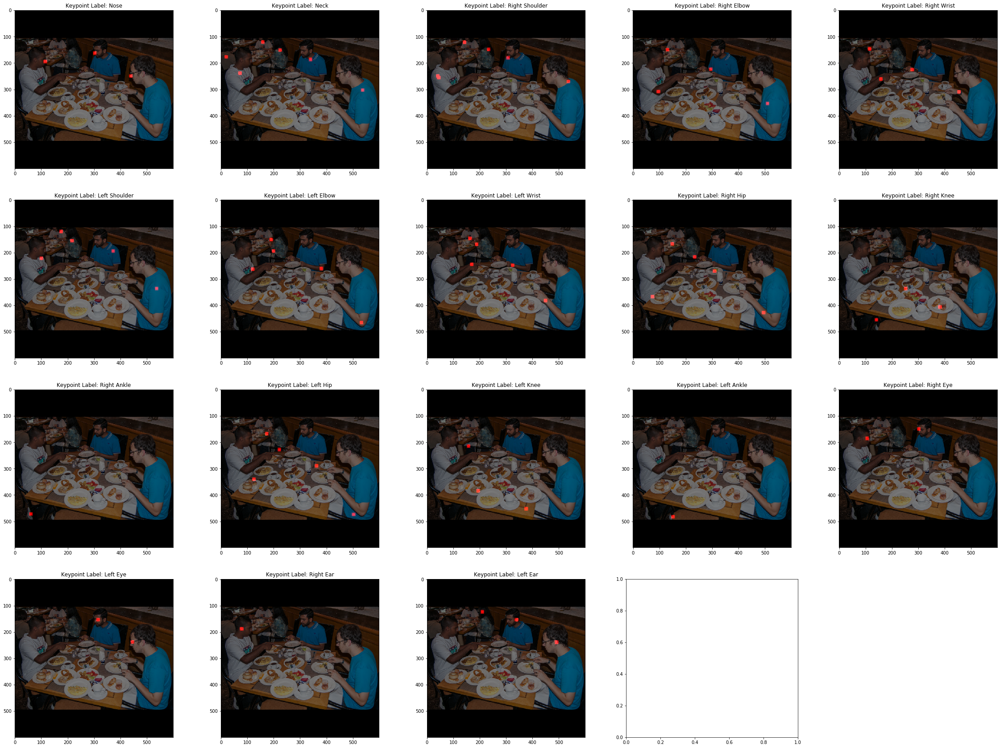

In [104]:
plt.figure(figsize=(40,30))
for i in range(heatmaps.shape[1]):
    plt.subplot(4,5,i+1)
    ax = plt.gca()
    title = f"Keypoint Label: {IDX_TO_KPT_NAME[i]}"
    visualizations.overlay_heatmap(heatmap=np.array(heatmaps[0,i,:]), img=np.array(imgs[0,:]), ax=ax, title=title)
plt.tight_layout()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


KeyError: 18

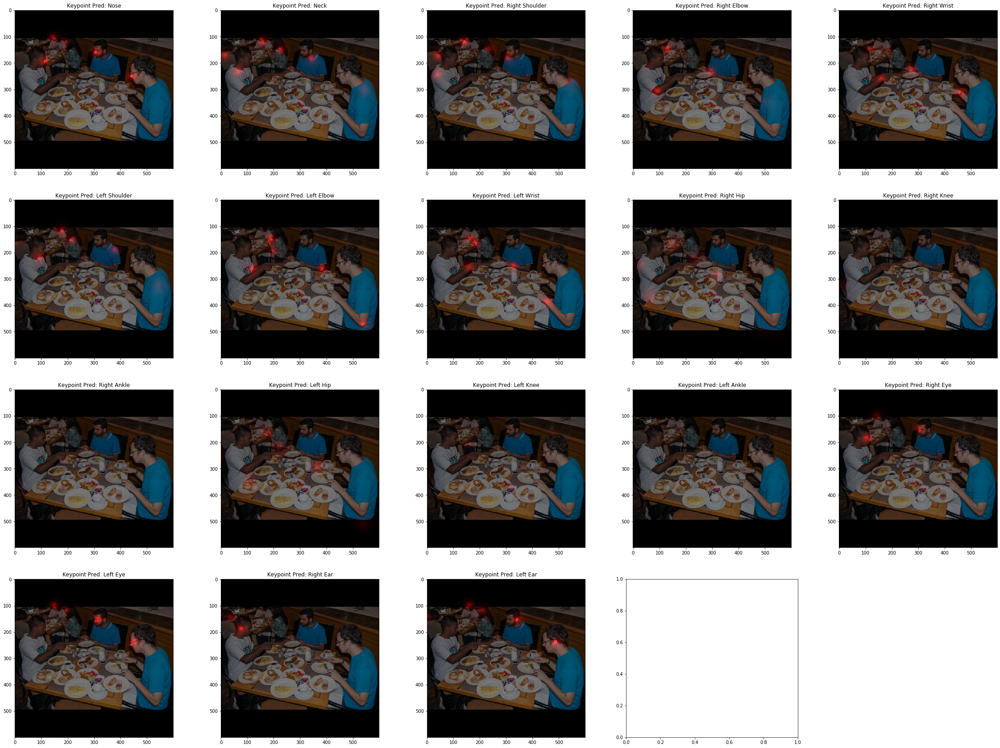

In [103]:
plt.figure(figsize=(40,30))
for i in range(scaled_hms.shape[0]):
    plt.subplot(4,5,i+1)
    ax = plt.gca()
    title = f"Keypoint Pred: {IDX_TO_KPT_NAME[i]}"
    visualizations.overlay_heatmap(heatmap=scaled_hms[i,:], img=np.array(imgs[0,:]), ax=ax, title=title)
plt.tight_layout()
plt.show()

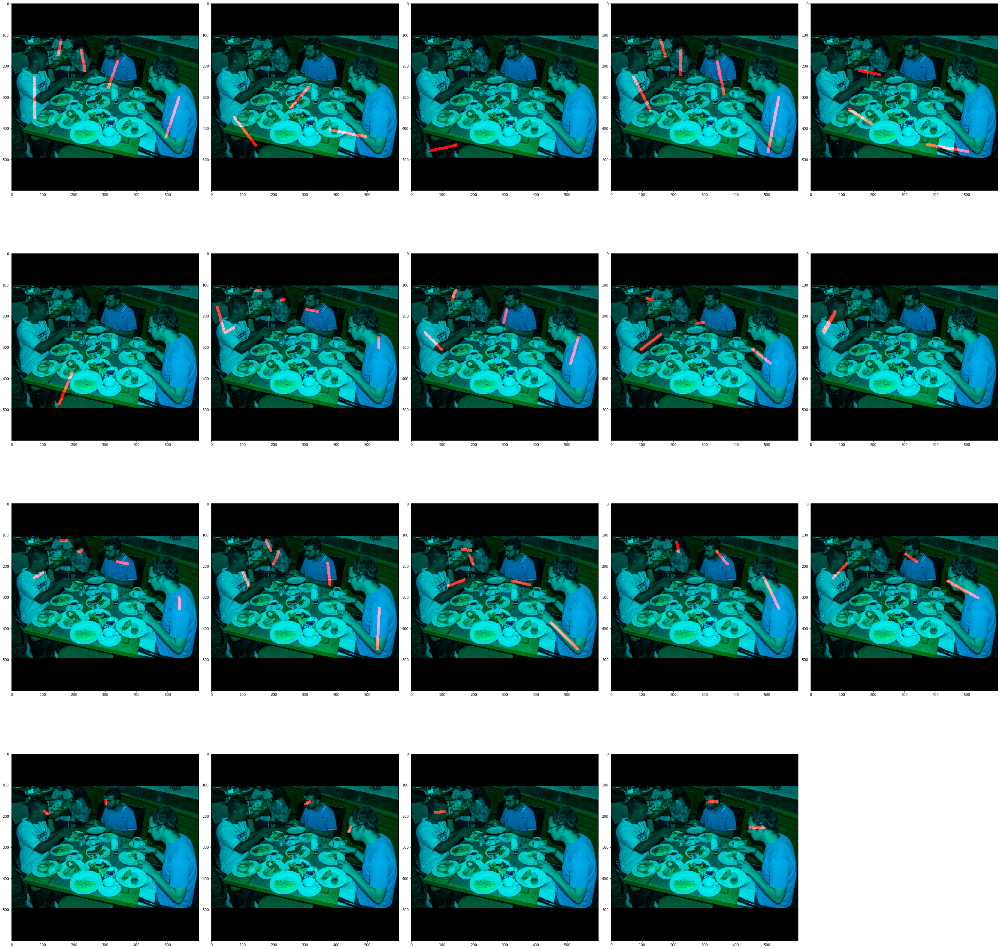

In [80]:
plt.figure(figsize=(40,60))
for i in range(19):
    plt.subplot(6,5,i+1)
    ax = plt.gca()
    visualizations.overlay_paf(pafs=np.array(pafs[0,2*i:2*i+2,:]), img=np.array(imgs[0,:]), ax=ax)
plt.tight_layout()
plt.show()

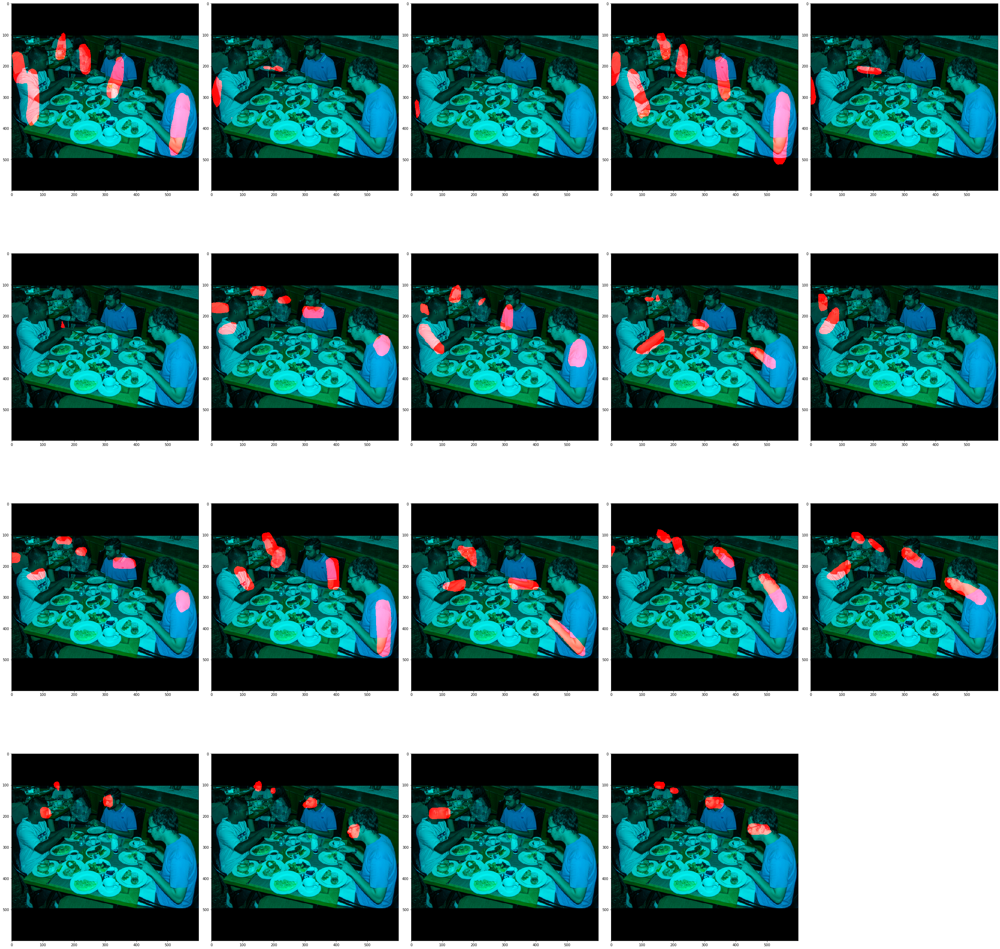

In [81]:
plt.figure(figsize=(40,60))
for i in range(19):
    plt.subplot(6,5,i+1)
    ax = plt.gca()
    visualizations.overlay_paf(pafs=scaled_pafs[2*i:2*i+2,:], img=np.array(imgs[0,:]), ax=ax)
plt.tight_layout()
plt.show()

## Grouping and Skeleton Rendering


In [82]:
cur_img = np.array(imgs[0,:])

In [83]:
coords_1, keypoints_1 = pose_parsing.extract_joins_heatmap(heatmaps[0,:], min_distance=1, thr=0.3)
coords_2, keypoints_2 = pose_parsing.extract_joins_heatmap(scaled_hms, min_distance=1, thr=0.3)

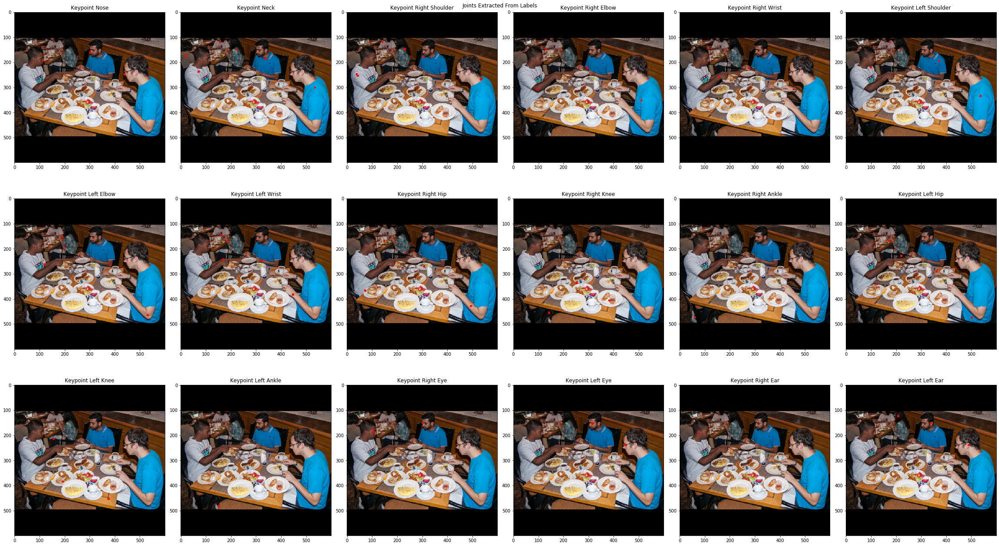

In [84]:
plt.figure(figsize=(32, 18))
zoom = 4

aux_img = np.array([cur_img[2,:,:], cur_img[1,:,:], cur_img[0,:,:]])
aux_img = np.copy(aux_img).transpose(1,2,0)*256 + 128
aux_img = np.round(aux_img).astype(int)

for i, keypoint in enumerate(keypoints_1):
    
    aux = np.copy(aux_img)
    if(len(keypoint) > 0):
        for k in keypoint:
            aux[k[0]-zoom:k[0]+zoom, k[1]-zoom:k[1]+zoom,0] = 255
            aux[k[0]-zoom:k[0]+zoom, k[1]-zoom:k[1]+zoom,1] = 0
            aux[k[0]-zoom:k[0]+zoom, k[1]-zoom:k[1]+zoom,2] = 0
    
    plt.subplot(3,6,i+1)
    plt.imshow(aux)
    plt.title(f"Keypoint {IDX_TO_KPT_NAME[i]}")
    
plt.suptitle("Joints Extracted From Labels")
plt.tight_layout()
plt.show()

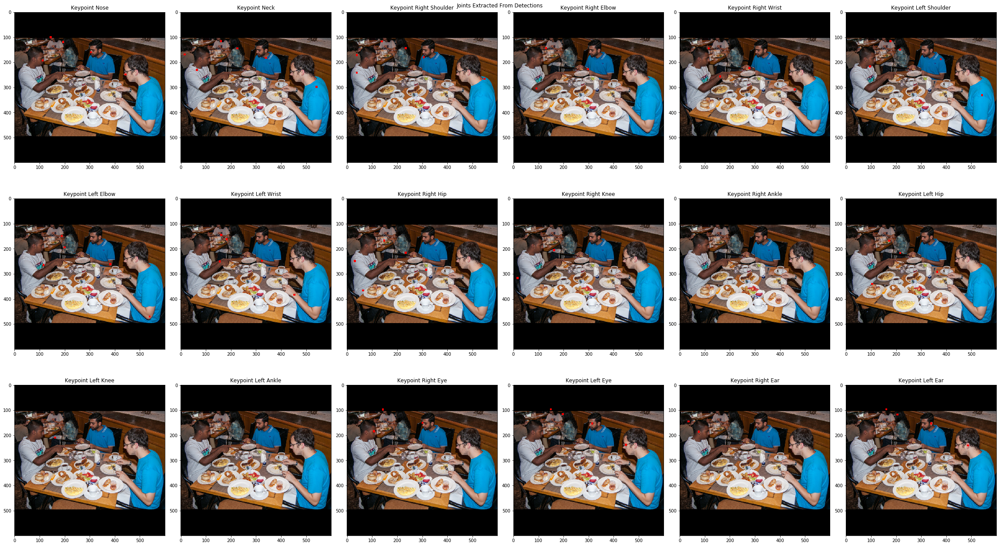

In [85]:
plt.figure(figsize=(32, 18))
zoom = 4

aux_img = np.array([cur_img[2,:,:], cur_img[1,:,:], cur_img[0,:,:]])
aux_img = np.copy(aux_img).transpose(1,2,0)*256 + 128
aux_img = np.round(aux_img).astype(int)

for i, keypoint in enumerate(keypoints_2):
    
    aux = np.copy(aux_img)
    if(len(keypoint) > 0):
        for k in keypoint:
            aux[k[0]-zoom:k[0]+zoom, k[1]-zoom:k[1]+zoom,0] = 255
            aux[k[0]-zoom:k[0]+zoom, k[1]-zoom:k[1]+zoom,1] = 0
            aux[k[0]-zoom:k[0]+zoom, k[1]-zoom:k[1]+zoom,2] = 0
    
    plt.subplot(3,6,i+1)
    plt.imshow(aux)
    plt.title(f"Keypoint {IDX_TO_KPT_NAME[i]}")
    
plt.suptitle("Joints Extracted From Detections")
plt.tight_layout()
plt.show()

In [86]:
pose_parsing.BODY_PARTS_PAF_IDS = CONSTANTS.BODY_PARTS_PAF_IDS_OPEN_POSE
pose_parsing.SKELETON = CONSTANTS.SKELETON_OPEN_POSE

In [87]:
# pose_entries, all_keypoints = pose_parsing.group_keypoints(keypoints_1, pafs[0,:], min_paf_score=0.05, thr_ratio=0.8)
pose_entries, all_keypoints, pose_entries_aux = pose_parsing.group_keypoints(keypoints_1, pafs[0,:], min_paf_score=0.05, thr_ratio=0.8, debug=True)

In [88]:
# pose_entries_det, all_keypoints_det = pose_parsing.group_keypoints(keypoints_2, scaled_pafs, min_paf_score=0.05, thr_ratio=0.8)
pose_entries_det, all_keypoints_det, pose_entries_det_aux = pose_parsing.group_keypoints(keypoints_2, scaled_pafs, min_paf_score=0.05, thr_ratio=0.8, debug=True)

In [89]:
print(f"Label Poses:             {len(pose_entries)}")
print(f"Unmerged Label Poses:    {len(pose_entries_aux)}")
print(f"Detected Poses:          {len(pose_entries_det)}")
print(f"Unmerged Detected Poses: {len(pose_entries_det_aux)}")

Label Poses:             9
Unmerged Label Poses:    15
Detected Poses:          7
Unmerged Detected Poses: 15


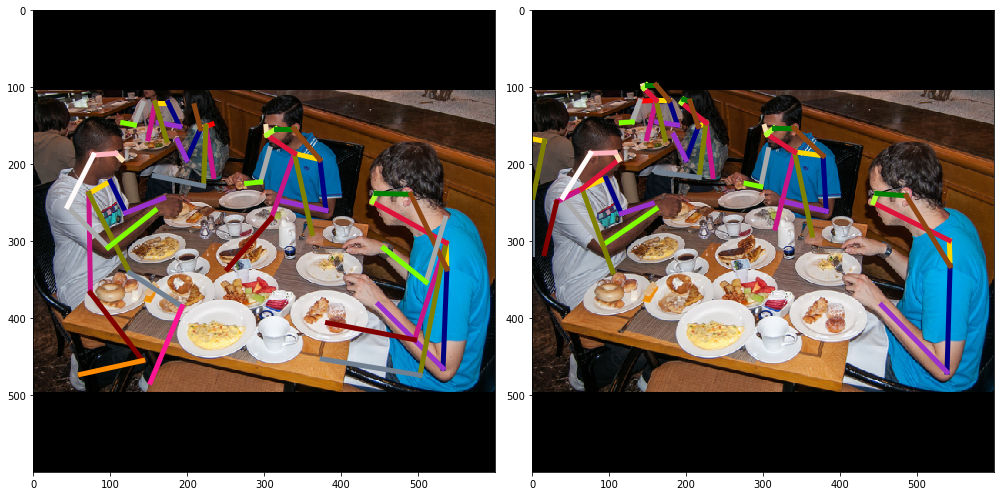

In [90]:
plt.figure(figsize=(14, 7))

plt.subplot(1,2,1)
ax = plt.gca()
title = "Pose from Labels"
visualizations.draw_pose(cur_img, pose_entries, all_keypoints, ax=ax, title=title)

plt.subplot(1,2,2)
ax = plt.gca()
title = "Predicted Poses"
visualizations.draw_pose(cur_img, pose_entries_det, all_keypoints_det, ax=ax, title=title)

plt.tight_layout()
plt.show()

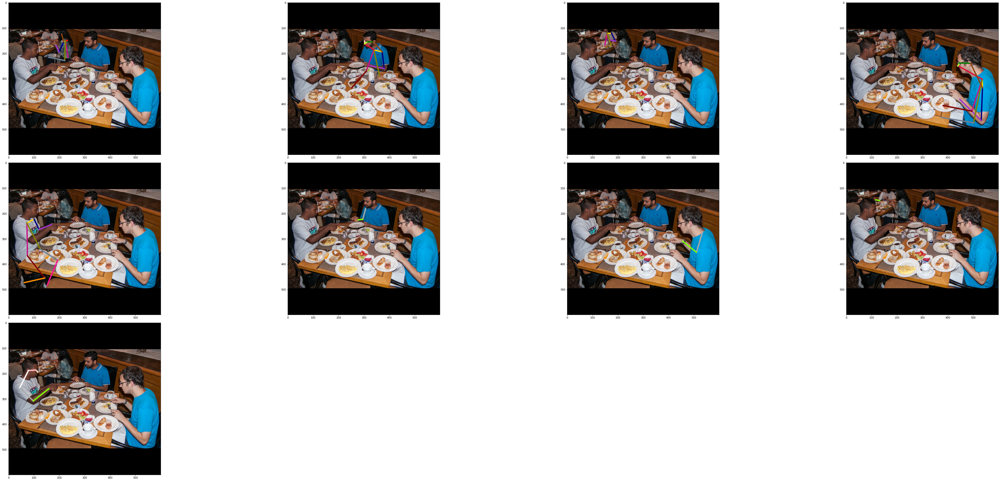

In [91]:
plt.figure(figsize=(60, 60))

for i in range(len(pose_entries)):
    plt.subplot(7,4,i+1)
    ax = plt.gca()
    title = f"Pose {i+1}"
    visualizations.draw_pose(cur_img, [pose_entries[i]], all_keypoints, ax=ax, title=title)

plt.tight_layout()
plt.show()

13.0
7.0
13.0
10.0
4.0
10.0
3.0


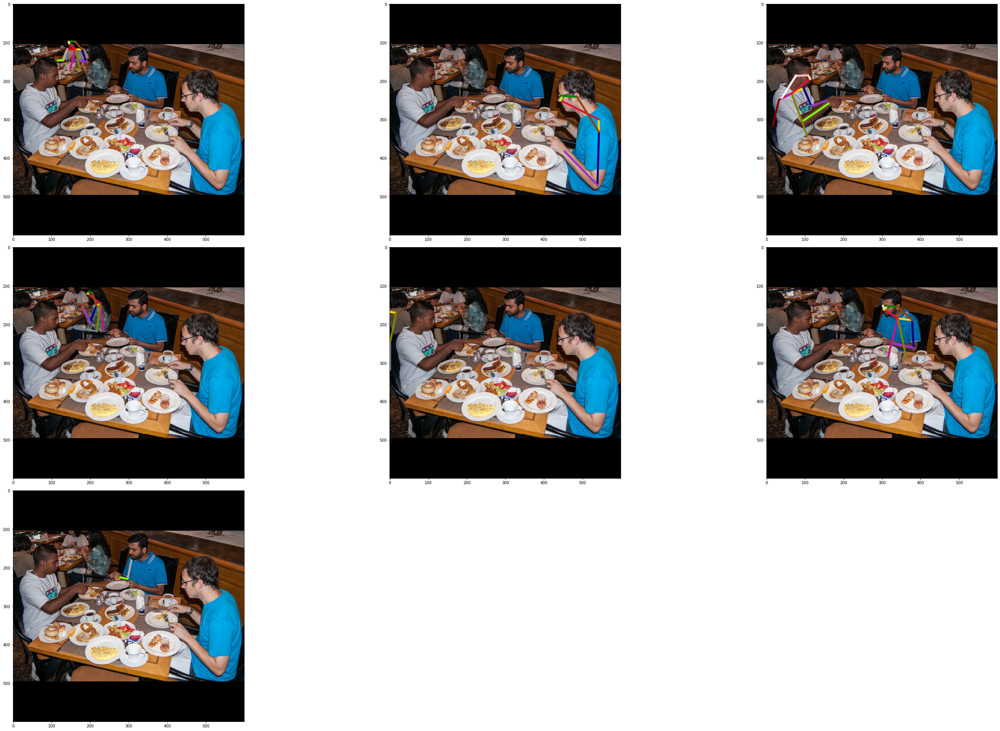

In [92]:
plt.figure(figsize=(40, 60))

for i in range(len(pose_entries_det)):
    plt.subplot(7,3,i+1)
    ax = plt.gca()
    title = f"Pose {i+1}"
    visualizations.draw_pose(cur_img, [pose_entries_det[i]], all_keypoints_det, ax=ax, title=title)
    print(pose_entries_det[i][-1])
plt.tight_layout()
plt.show()

## Evaluation

In [93]:
print(scaled_hms.shape)
print(scaled_pafs.shape)
print(metadata)

(19, 600, 600)
(38, 600, 600)
{'image_name': ['000000363666.jpg'], 'image_shape': tensor([[419, 640]])}


In [94]:
# computing predictions, loading previous results and appending new ones
utils.reset_predictions_file(test_exp)
cur_predictions = metrics.compute_predictions(scaled_hms, scaled_pafs, metadata, cur_size=image_size)
# cur_predictions = metrics.compute_predictions(np.array(heatmaps[0,:]), np.array(pafs[0,:]), metadata, cur_size=image_size)
utils.update_predictions_file(cur_predictions, test_exp)

In [95]:
data_path = CONFIG["paths"]["data_path"]
labels_path = os.path.join(data_path, "annotations")
labels_file = os.path.join(labels_path, "person_keypoints_validation.json")
preds_file = os.path.join(test_exp, CONFIG["paths"]["submission"])

In [96]:
stats = metrics.compute_precision(labels_file=labels_file, preds_file=preds_file)

loading annotations into memory...
Done (t=0.25s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *keypoints*
DONE (t=0.00s).
Accumulating evaluation results...
DONE (t=0.00s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] = 0.394
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets= 20 ] = 0.663
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets= 20 ] = 0.337
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets= 20 ] = 0.901
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets= 20 ] = 0.176
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 20 ] = 0.400
 Average Recall     (AR) @[ IoU=0.50      | area=   all | maxDets= 20 ] = 0.667
 Average Recall     (AR) @[ IoU=0.75      | area=   all | maxDets= 20 ] = 0.333
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | ma

## Additional Testing and Debbguing

In [97]:
# data_path = CONFIG["paths"]["data_path"]
labels_path = os.path.join(data_path, "annotations")
labels_file = os.path.join(labels_path, "person_keypoints_validation.json")
image_id = int(metadata["image_name"][0].split(".")[0])

In [98]:
with open(labels_file) as f:
    aux = json.load(f)

In [99]:
coco_gt = COCO(labels_file)
print("\n")
coco_dt = coco_gt.loadRes(preds_file)

loading annotations into memory...
Done (t=0.24s)
creating index...
index created!


Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!


In [100]:
cocoEval = COCOeval(coco_gt, coco_dt, "keypoints")
cocoEval._prepare()

In [101]:
dets = cocoEval._dts[image_id, 1][0]
lbls = cocoEval._gts[image_id, 1][0]["keypoints"]
all_lbls = cocoEval._gts[image_id, 1]

In [102]:
# dets_k = coco_keypoints_[0]
reshaped_dets_k = cur_predictions[0]["keypoints"]

print("IDX          Reshaped Dets   ----      Labels")
for i in range(len(reshaped_dets_k)//3):
#     if(reshaped_dets_k[3*i+2] == 0):
#         continue
    print(f"{i}:     {reshaped_dets_k[3*i: 3*i+3]}   ----   {lbls[3*i: 3*i+3]}")

IDX          Reshaped Dets   ----      Labels
0:     [155, -3, 1]   ----   [469, 155, 2]
1:     [159, -7, 1]   ----   [475, 143, 2]
2:     [0, -111, 0]   ----   [0, 0, 0]
3:     [0, -111, 0]   ----   [523, 144, 2]
4:     [0, -111, 0]   ----   [0, 0, 0]
5:     [190, 14, 1]   ----   [573, 248, 2]
6:     [149, 15, 1]   ----   [571, 177, 2]
7:     [202, 48, 1]   ----   [567, 386, 2]
8:     [139, 44, 1]   ----   [544, 266, 2]
9:     [173, 44, 1]   ----   [478, 297, 2]
10:     [124, 45, 1]   ----   [485, 219, 2]
11:     [185, 68, 1]   ----   [536, 396, 2]
12:     [159, 67, 1]   ----   [528, 346, 2]
13:     [0, -111, 0]   ----   [400, 373, 1]
14:     [0, -111, 0]   ----   [408, 323, 1]
15:     [0, -111, 0]   ----   [0, 0, 0]
16:     [0, -111, 0]   ----   [0, 0, 0]


<div class=alert style="background-color:#F5F5F5; border-color:#C8C8C8">
   This notebook was created by <b>Angel Villar-Corrales</b>
</div> 
